Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model loaded successfully!
Found 228 images

Processing: thumb2444_jpg.rf.1bbb0686e572afee262de60241dd5b71.jpg


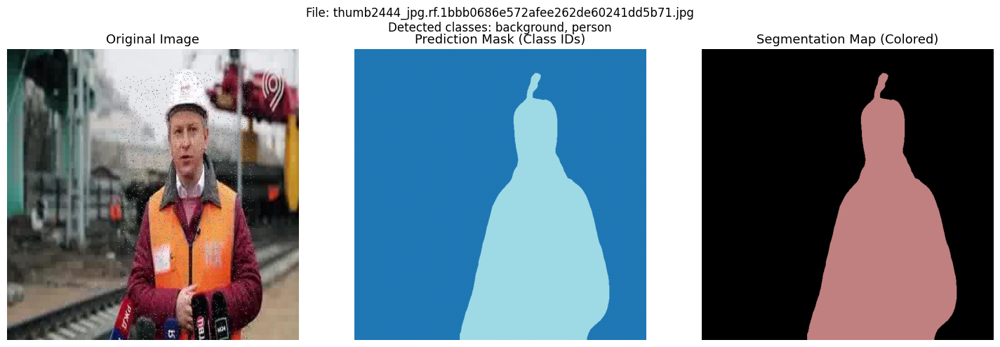

Detected: ['background', 'person']



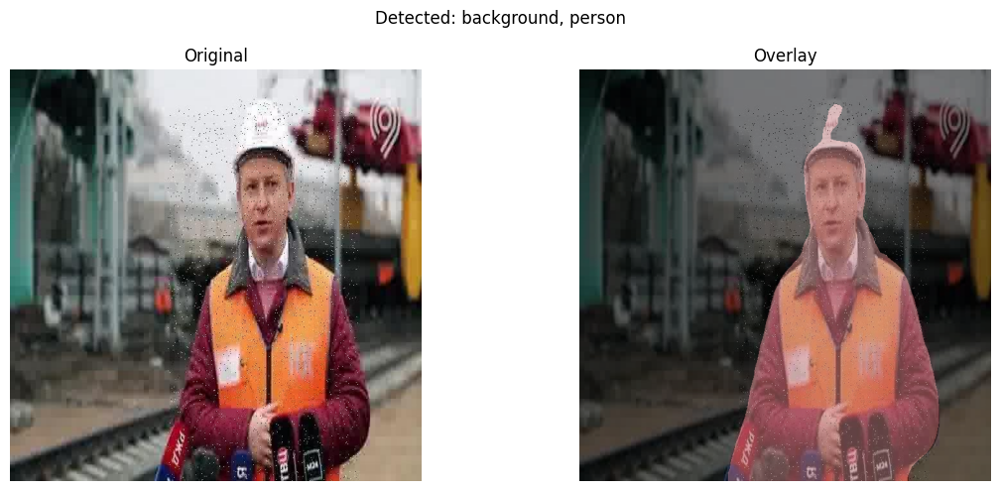

Processing: 2_0_92142907_jpg.rf.9b42b83589c89b719ea044a45f05bc9e.jpg


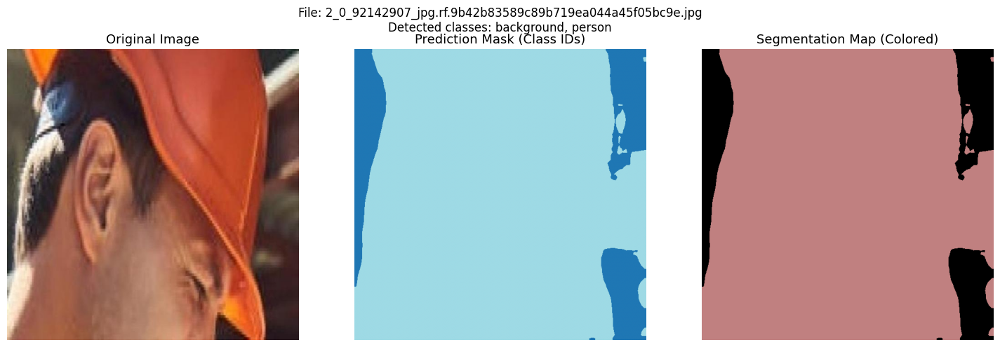

Detected: ['background', 'person']



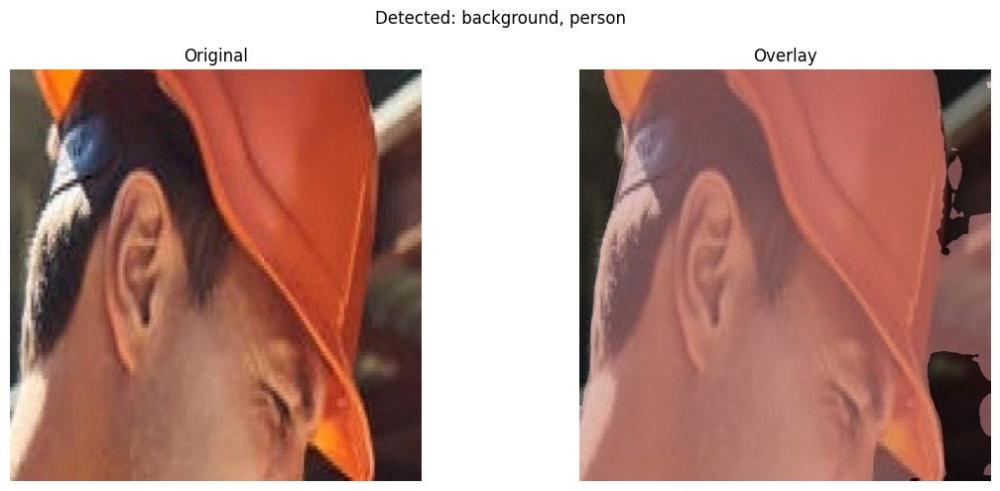

Processing: 0_40590632_jpg.rf.2479de5c3a1b9f1f857aeb668f762cfa.jpg


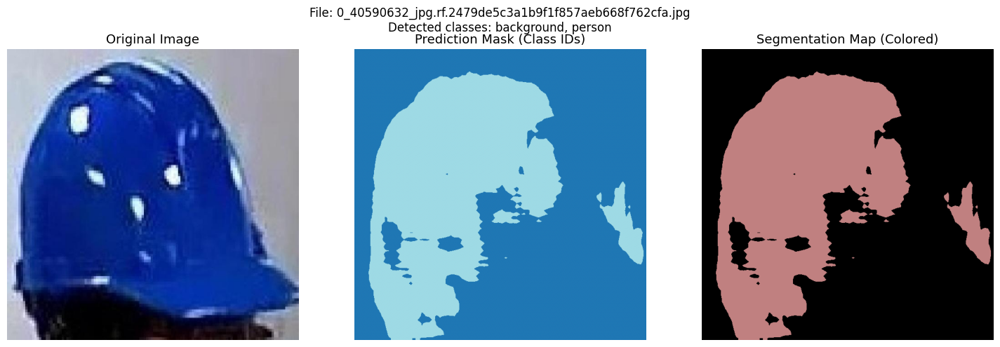

Detected: ['background', 'person']



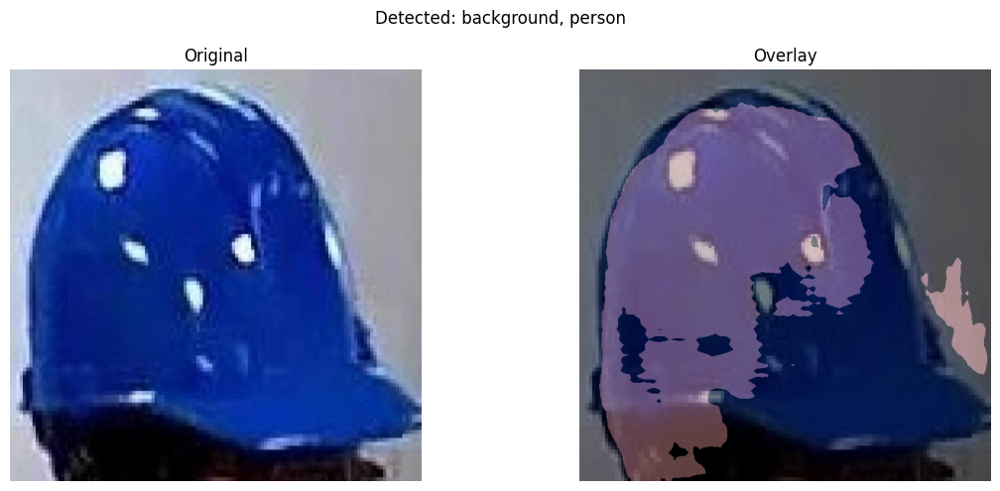

Processing: 2_0_86778861_jpg.rf.c218c683d335c4fd74a23db071383df3.jpg


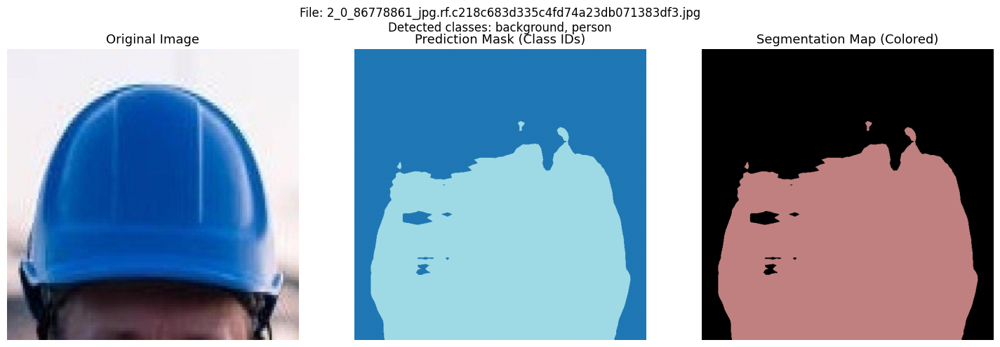

Detected: ['background', 'person']



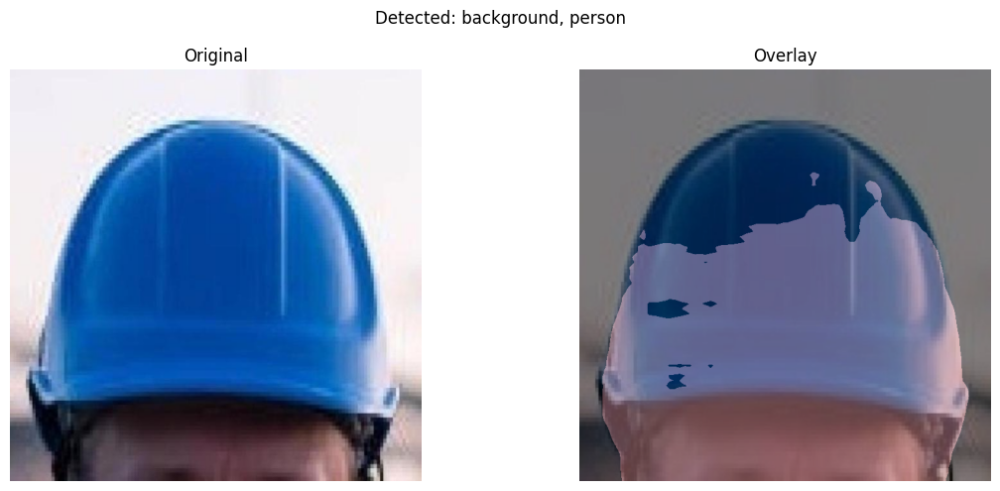

Processing: 0_85509621_jpg.rf.199b600d6cb673e30970d83b3bdd4b42.jpg


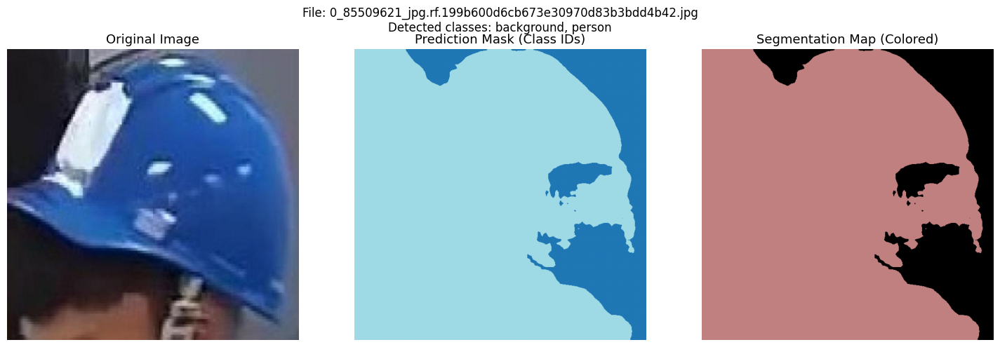

Detected: ['background', 'person']



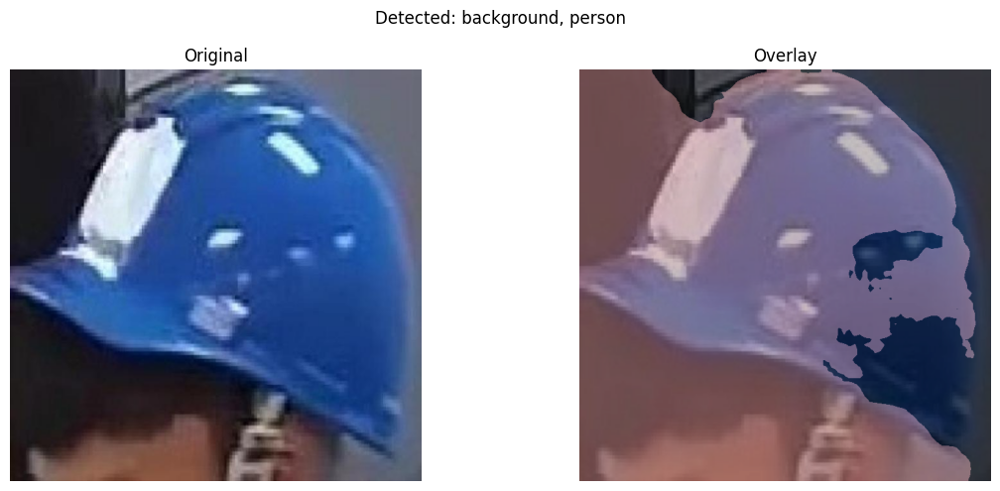


====== Detection Summary ======
thumb2444_jpg.rf.1bbb0686e572afee262de60241dd5b71.jpg → ['background', 'person']
2_0_92142907_jpg.rf.9b42b83589c89b719ea044a45f05bc9e.jpg → ['background', 'person']
0_40590632_jpg.rf.2479de5c3a1b9f1f857aeb668f762cfa.jpg → ['background', 'person']
2_0_86778861_jpg.rf.c218c683d335c4fd74a23db071383df3.jpg → ['background', 'person']
0_85509621_jpg.rf.199b600d6cb673e30970d83b3bdd4b42.jpg → ['background', 'person']


In [ ]:
# ============================================================
# TASK 1: Test DeepLabV3+ on Your Own Labelled Data
# ============================================================

# ---- Step 1: Mount Google Drive ----
from google.colab import drive
drive.mount('/content/drive')

import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from PIL import Image
from torchvision import models, transforms

# ---- Check GPU ----
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# ============================================================
# CHANGE 1: Paste your image folder path here
# How to find it → run this in a new cell:
#   import os
#   print(os.listdir('/content/drive/MyDrive'))
# Then keep clicking into your folder to find the path
# ============================================================
IMAGE_DIR = '/content/drive/MyDrive/yolov8_results/images/train'  # <-- change this


# ---- Load DeepLabV3+ Pretrained Model ----
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.eval()
model.to(device)
print("Model loaded successfully!")


# ---- Pascal VOC 21 Class Names ----
# DeepLabV3 is pretrained on Pascal VOC which has these 21 classes
VOC_CLASSES = [
    'background', 'aeroplane', 'bicycle', 'bird',     'boat',
    'bottle',     'bus',       'car',     'cat',       'chair',
    'cow',        'diningtable','dog',    'horse',     'motorbike',
    'person',     'pottedplant','sheep',  'sofa',      'train',
    'tvmonitor'
]

# ---- Color palette for 21 classes ----
VOC_COLORS = np.array([
    [  0,   0,   0], [128,   0,   0], [  0, 128,   0], [128, 128,   0],
    [  0,   0, 128], [128,   0, 128], [  0, 128, 128], [128, 128, 128],
    [ 64,   0,   0], [192,   0,   0], [ 64, 128,   0], [192, 128,   0],
    [ 64,   0, 128], [192,   0, 128], [ 64, 128, 128], [192, 128, 128],
    [  0,  64,   0], [128,  64,   0], [  0, 192,   0], [128, 192,   0],
    [  0,  64, 128]
], dtype=np.uint8)


# ---- Preprocessing Pipeline (required by DeepLabV3) ----
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],   # ImageNet mean — do NOT change
        std= [0.229, 0.224, 0.225]    # ImageNet std  — do NOT change
    )
])


# ---- Decode Segmentation Map to Color Image ----
def decode_segmentation(mask, num_classes=21):
    h, w  = mask.shape
    color = np.zeros((h, w, 3), dtype=np.uint8)
    for cls in range(num_classes):
        color[mask == cls] = VOC_COLORS[cls]
    return color


# ---- Run Segmentation on One Image ----
def segment_image(image_path):
    # Load image
    image = Image.open(image_path).convert('RGB')
    image_np = np.array(image)

    # Preprocess
    input_tensor = preprocess(image).unsqueeze(0).to(device)

    # Inference
    with torch.no_grad():
        output = model(input_tensor)['out'][0]

    # Get class predictions
    output_predictions = output.argmax(0).cpu().numpy()

    # Decode to color map
    seg_map = decode_segmentation(output_predictions)

    # Find which classes were detected
    detected_ids    = np.unique(output_predictions)
    detected_names  = [VOC_CLASSES[i] for i in detected_ids if i < len(VOC_CLASSES)]

    return image_np, output_predictions, seg_map, detected_names


# ---- Visualize Single Image Result ----
def visualize_single(image_path):
    image_np, pred_mask, seg_map, detected = segment_image(image_path)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(image_np)
    axes[0].set_title('Original Image', fontsize=13)
    axes[0].axis('off')

    axes[1].imshow(pred_mask, cmap='tab20')
    axes[1].set_title('Prediction Mask (Class IDs)', fontsize=13)
    axes[1].axis('off')

    axes[2].imshow(seg_map)
    axes[2].set_title('Segmentation Map (Colored)', fontsize=13)
    axes[2].axis('off')

    fname = os.path.basename(image_path)
    plt.suptitle(
        f'File: {fname}\nDetected classes: {", ".join(detected)}',
        fontsize=12
    )
    plt.tight_layout()
    plt.show()
    print(f"Detected: {detected}\n")


# ---- Visualize Overlay (original + segmentation blended) ----
def visualize_overlay(image_path, alpha=0.5):
    image_np, _, seg_map, detected = segment_image(image_path)

    # Resize seg_map to match original image size
    seg_resized = cv2.resize(
        seg_map,
        (image_np.shape[1], image_np.shape[0]),
        interpolation=cv2.INTER_NEAREST
    )
    overlay = cv2.addWeighted(image_np, 1 - alpha, seg_resized, alpha, 0)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(image_np);  axes[0].set_title('Original');  axes[0].axis('off')
    axes[1].imshow(overlay);   axes[1].set_title('Overlay');   axes[1].axis('off')
    plt.suptitle(f'Detected: {", ".join(detected)}', fontsize=12)
    plt.tight_layout()
    plt.show()


# ============================================================
# RUN ON ALL IMAGES IN YOUR FOLDER
# ============================================================
valid_exts  = ('.jpg', '.jpeg', '.png', '.bmp')
image_files = [
    f for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith(valid_exts)
]
print(f"Found {len(image_files)} images\n")

# ============================================================
# CHANGE 2: max_images controls how many images to test
# Set to None to run on all images
# ============================================================
max_images = 5   # <-- change

for fname in image_files[:max_images]:
    path = os.path.join(IMAGE_DIR, fname)
    print(f"Processing: {fname}")
    visualize_single(path)
    visualize_overlay(path)


# ---- Summary: Class Detection Across All Images ----
print("\n====== Detection Summary ======")
all_detected = {}

for fname in image_files[:max_images]:
    path = os.path.join(IMAGE_DIR, fname)
    _, _, _, detected = segment_image(path)
    all_detected[fname] = detected
    print(f"{fname:30s} → {detected}")

In [ ]:
import os
print(os.listdir('/content/drive/MyDrive'))

['MST_6717.JPG', 'fsc.jpg', 'transcript.jpg', 'GAT.jpg', 'degree.jpg', 'matric (1).jpg', 'MST_6642.JPG', 'MST_6637.JPG', 'MST_7028.JPG', 'MST_7030.JPG', 'MST_7038.JPG', 'MST_7034.JPG', 'MST_7033.JPG', 'MST_6635.JPG', 'MST_7029.JPG', 'MST_6640.JPG', 'MST_7040.JPG', 'MST_6641.JPG', 'MST_6636.JPG', 'MST_7039.JPG', 'MST_7035.JPG', 'DUA PIC.jpg', 'ID Father.jpg', 'DUA ID.jpg', 'sl nust.jpg', 'Colab Notebooks', 'E.pdf', 'helmet.v2i.coco.zip', 'yolov8_results', 'Copy of helmet.v2i.coco.zip']


In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/helmet.v2i.coco.zip'
extraction_path = '/content/drive/MyDrive/yolov8_results/images'

# Create the extraction directory if it doesn't exist
os.makedirs(extraction_path, exist_ok=True)

print(f"Extracting {zip_file_path} to {extraction_path}...")
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_path)
print("Extraction complete!")

# Verify contents (optional, but good for debugging)
print(f"Contents of {extraction_path} after extraction:")
print(os.listdir(extraction_path))

Extracting /content/drive/MyDrive/helmet.v2i.coco.zip to /content/drive/MyDrive/yolov8_results/images...
Extraction complete!
Contents of /content/drive/MyDrive/yolov8_results/images after extraction:
['valid', 'test', 'train', 'README.roboflow.txt']


TASK 2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


100%|██████████| 170M/170M [00:01<00:00, 115MB/s]


Mask R-CNN loaded successfully!
Found 228 images


Processing: thumb2444_jpg.rf.1bbb0686e572afee262de60241dd5b71.jpg
----------------------------------------


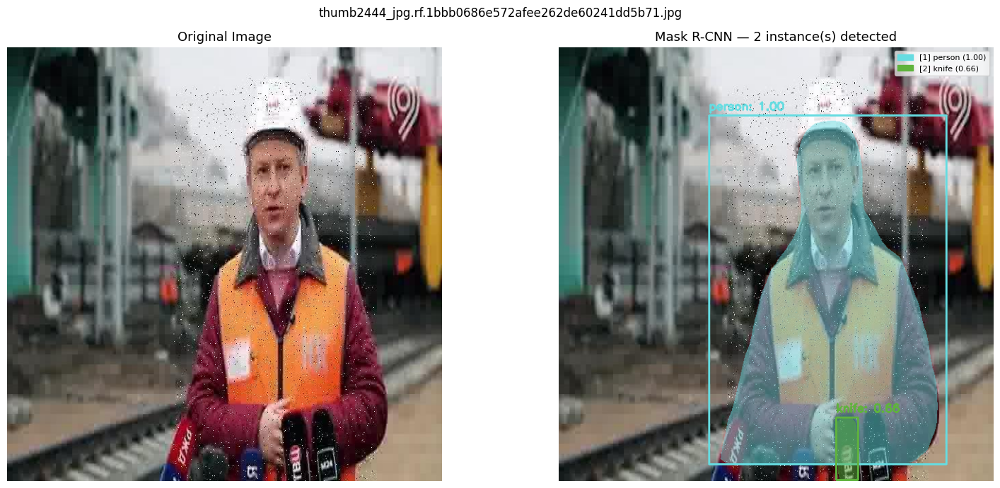

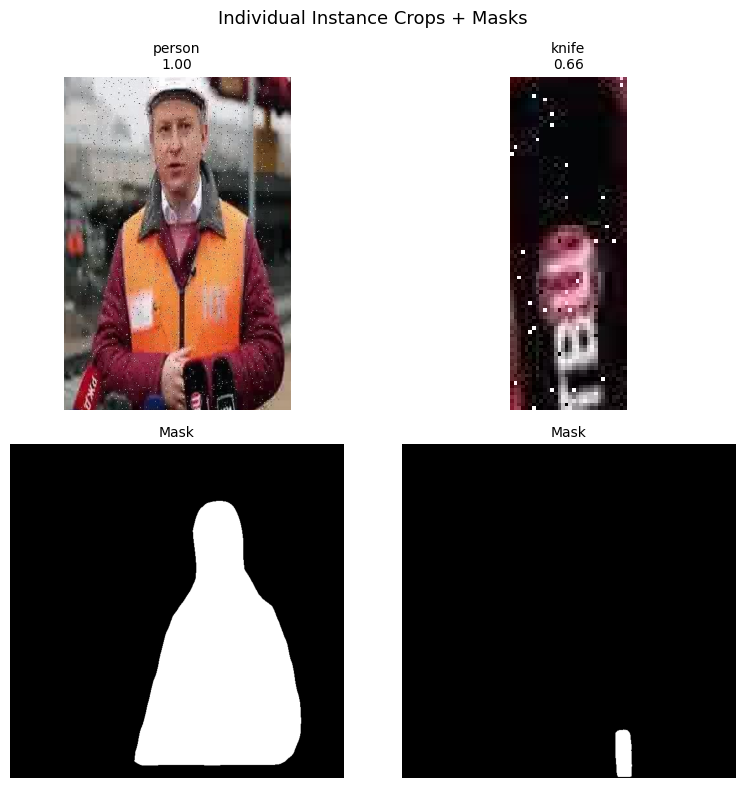

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


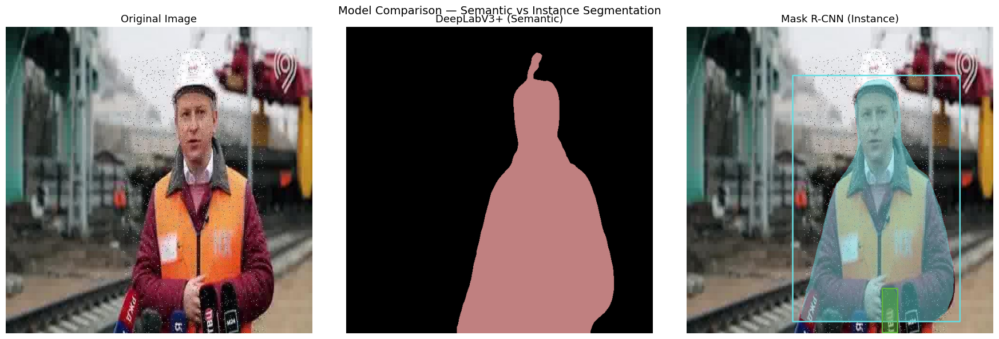


Processing: 2_0_92142907_jpg.rf.9b42b83589c89b719ea044a45f05bc9e.jpg
----------------------------------------


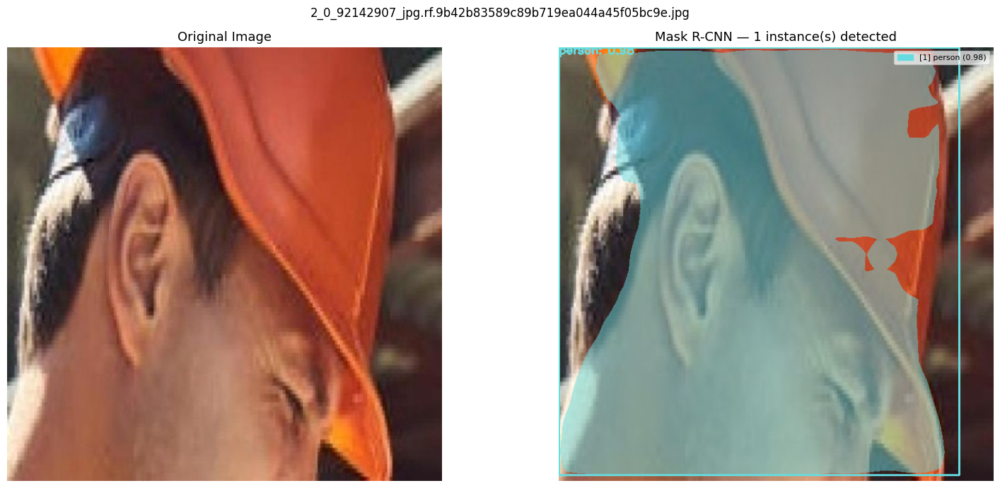

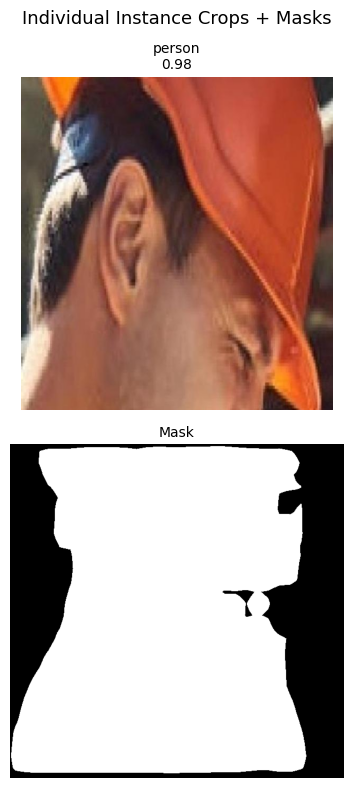

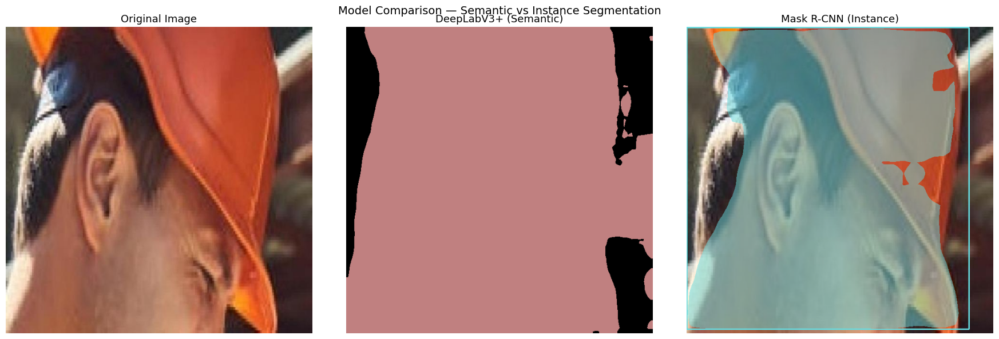


Processing: 0_40590632_jpg.rf.2479de5c3a1b9f1f857aeb668f762cfa.jpg
----------------------------------------


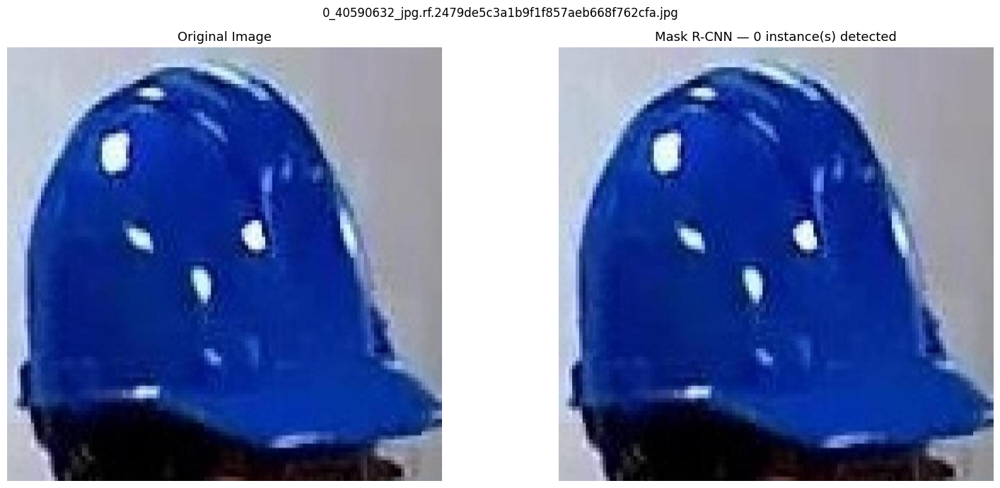

No instances detected above threshold.


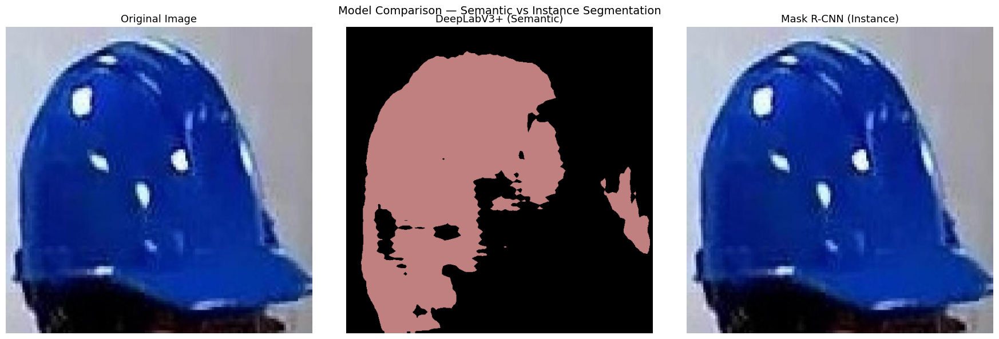


Processing: 2_0_86778861_jpg.rf.c218c683d335c4fd74a23db071383df3.jpg
----------------------------------------


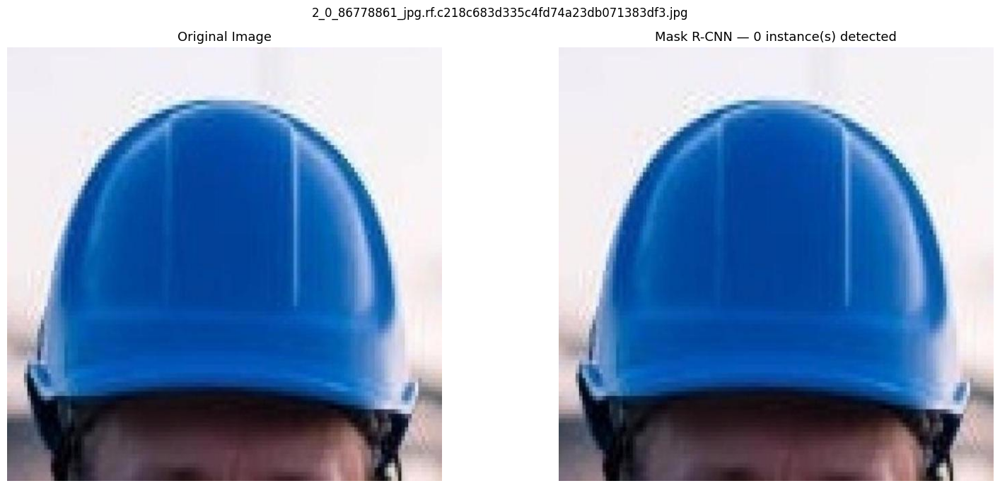

No instances detected above threshold.


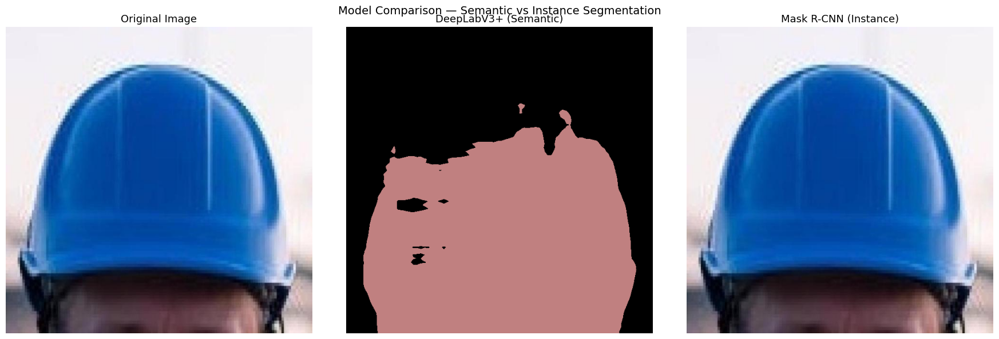


Processing: 0_85509621_jpg.rf.199b600d6cb673e30970d83b3bdd4b42.jpg
----------------------------------------


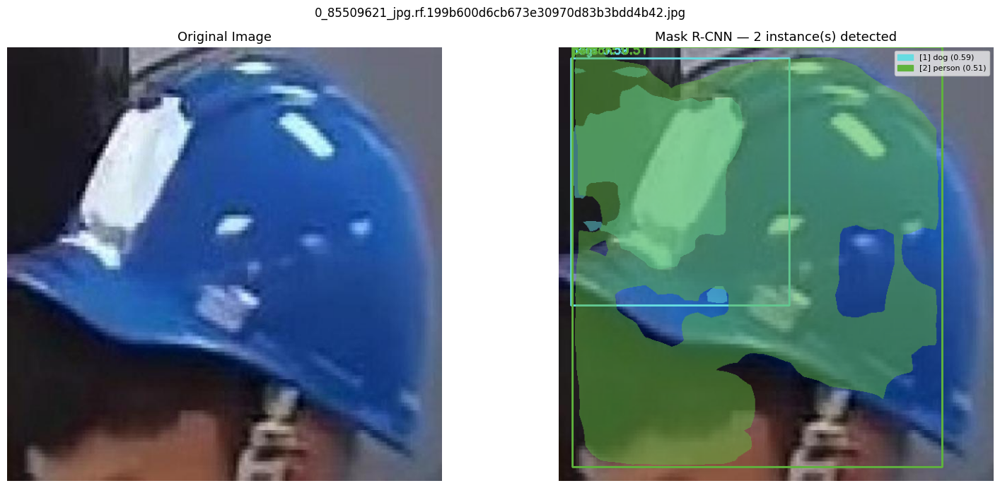

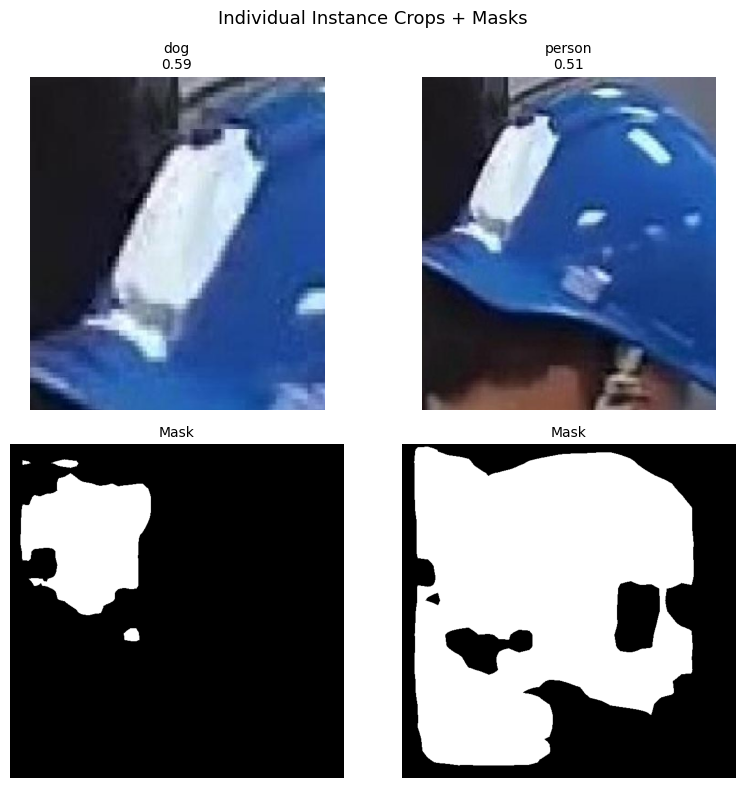

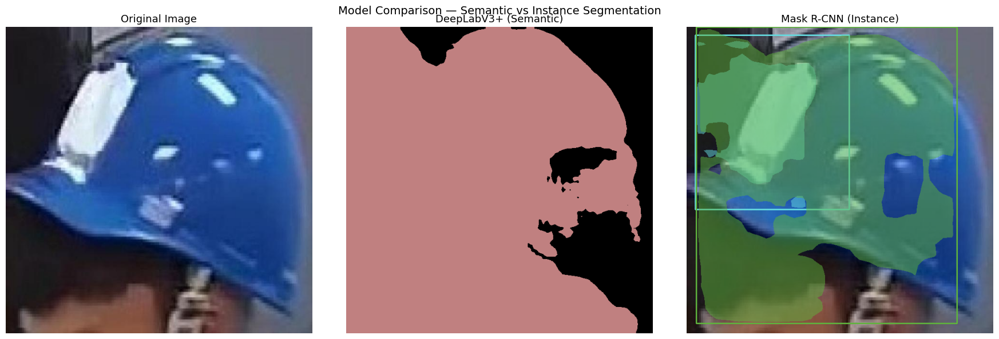

In [ ]:
# ============================================================
# TASK 2: Mask R-CNN Implementation
# Mask R-CNN does instance segmentation:
# → detects each object separately with its own mask + box
# DeepLabV3 labels pixels by class only (no separate instances)
# Mask R-CNN labels EACH individual object separately
# ============================================================

import torch
import torchvision
from torchvision import models, transforms
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
import os
from PIL import Image
from google.colab import drive

drive.mount('/content/drive')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# ============================================================
# CHANGE 1: Your image folder path (same as Task 1)
# ============================================================
IMAGE_DIR = '/content/drive/MyDrive/yolov8_results/images/train'  # <-- change


# ---- COCO Class Names (Mask R-CNN is trained on COCO = 80 classes) ----
COCO_CLASSES = [
    '__background__', 'person',      'bicycle',    'car',         'motorcycle',
    'airplane',       'bus',         'train',      'truck',       'boat',
    'traffic light',  'fire hydrant','stop sign',  'parking meter','bench',
    'bird',           'cat',         'dog',        'horse',       'sheep',
    'cow',            'elephant',    'bear',       'zebra',       'giraffe',
    'backpack',       'umbrella',    'handbag',    'tie',         'suitcase',
    'frisbee',        'skis',        'snowboard',  'sports ball', 'kite',
    'baseball bat',   'baseball glove','skateboard','surfboard',  'tennis racket',
    'bottle',         'wine glass',  'cup',        'fork',        'knife',
    'spoon',          'bowl',        'banana',     'apple',       'sandwich',
    'orange',         'broccoli',    'carrot',     'hot dog',     'pizza',
    'donut',          'cake',        'chair',      'couch',       'potted plant',
    'bed',            'dining table','toilet',     'tv',          'laptop',
    'mouse',          'remote',      'keyboard',   'cell phone',  'microwave',
    'oven',           'toaster',     'sink',        'refrigerator','book',
    'clock',          'vase',        'scissors',   'teddy bear',  'hair drier',
    'toothbrush'
]

# ---- Random colors for each instance ----
np.random.seed(42)
INSTANCE_COLORS = np.random.randint(0, 255, (200, 3), dtype=np.uint8)


# ---- Load Mask R-CNN Pretrained Model ----
mask_rcnn = models.detection.maskrcnn_resnet50_fpn(pretrained=True)
mask_rcnn.eval()
mask_rcnn.to(device)
print("Mask R-CNN loaded successfully!")


# ---- Preprocessing for Mask R-CNN ----
# Note: Mask R-CNN only needs ToTensor, NOT Normalize
transform = transforms.Compose([transforms.ToTensor()])


# ---- Run Mask R-CNN on One Image ----
def run_maskrcnn(image_path, threshold=0.5):
    """
    threshold: confidence score cutoff
    Only detections above this score are shown
    CHANGE threshold lower (0.3) to see more detections
    CHANGE threshold higher (0.7) to see only confident ones
    """
    image   = Image.open(image_path).convert('RGB')
    img_np  = np.array(image)
    tensor  = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = mask_rcnn(tensor)

    output  = outputs[0]
    boxes   = output['boxes'].cpu().numpy()
    labels  = output['labels'].cpu().numpy()
    scores  = output['scores'].cpu().numpy()
    masks   = output['masks'].cpu().numpy()   # shape: (N, 1, H, W)

    # Filter by confidence threshold
    keep    = scores >= threshold
    boxes   = boxes[keep]
    labels  = labels[keep]
    scores  = scores[keep]
    masks   = masks[keep]

    return img_np, boxes, labels, scores, masks


# ---- Draw Masks + Boxes + Labels ----
def visualize_maskrcnn(image_path, threshold=0.5):
    img_np, boxes, labels, scores, masks = run_maskrcnn(image_path, threshold)

    # Canvas for masks
    overlay    = img_np.copy()
    legend_patches = []

    for i in range(len(boxes)):
        color     = INSTANCE_COLORS[i % len(INSTANCE_COLORS)].tolist()
        class_id  = labels[i]
        class_name= COCO_CLASSES[class_id] if class_id < len(COCO_CLASSES) else 'unknown'
        score     = scores[i]

        # Apply mask
        mask_bin  = masks[i, 0] > 0.5           # binary mask
        overlay[mask_bin] = (
            np.array(overlay[mask_bin], dtype=np.float32) * 0.5 +
            np.array(color, dtype=np.float32)    * 0.5
        ).astype(np.uint8)

        # Draw bounding box
        x1, y1, x2, y2 = map(int, boxes[i])
        cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 2)

        # Draw label text
        label_text = f"{class_name}: {score:.2f}"
        cv2.putText(
            overlay, label_text, (x1, max(y1 - 8, 10)),
            cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2
        )

        legend_patches.append(
            mpatches.Patch(
                color=[c/255 for c in color],
                label=f"[{i+1}] {class_name} ({score:.2f})"
            )
        )

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))

    axes[0].imshow(img_np)
    axes[0].set_title('Original Image', fontsize=13)
    axes[0].axis('off')

    axes[1].imshow(overlay)
    axes[1].set_title(
        f'Mask R-CNN — {len(boxes)} instance(s) detected', fontsize=13
    )
    axes[1].axis('off')

    if legend_patches:
        axes[1].legend(
            handles=legend_patches,
            loc='upper right',
            fontsize=8,
            framealpha=0.7
        )

    plt.suptitle(os.path.basename(image_path), fontsize=12)
    plt.tight_layout()
    plt.show()

    return labels, scores


# ---- Show Individual Masks Per Instance ----
def show_individual_masks(image_path, threshold=0.5):
    img_np, boxes, labels, scores, masks = run_maskrcnn(image_path, threshold)

    n = len(masks)
    if n == 0:
        print("No instances detected above threshold.")
        return

    # ============================================================
    # CHANGE 2: max_show = how many individual masks to display
    # ============================================================
    max_show = min(n, 6)   # <-- change

    fig, axes = plt.subplots(2, max_show, figsize=(4 * max_show, 8))
    if max_show == 1:
        axes = np.expand_dims(axes, axis=1)

    for i in range(max_show):
        class_id   = labels[i]
        class_name = COCO_CLASSES[class_id] if class_id < len(COCO_CLASSES) else 'unknown'
        mask_bin   = (masks[i, 0] > 0.5).astype(np.uint8)

        # Crop region using bounding box
        x1, y1, x2, y2 = map(int, boxes[i])
        cropped = img_np[y1:y2, x1:x2]

        axes[0][i].imshow(cropped)
        axes[0][i].set_title(f'{class_name}\n{scores[i]:.2f}', fontsize=10)
        axes[0][i].axis('off')

        axes[1][i].imshow(mask_bin, cmap='gray')
        axes[1][i].set_title('Mask', fontsize=10)
        axes[1][i].axis('off')

    plt.suptitle('Individual Instance Crops + Masks', fontsize=13)
    plt.tight_layout()
    plt.show()


# ---- Compare DeepLabV3 vs Mask R-CNN Side by Side ----
def compare_models(image_path, threshold=0.5):
    # --- DeepLabV3 ---
    deeplab_model = models.segmentation.deeplabv3_resnet101(pretrained=True)
    deeplab_model.eval().to(device)

    preprocess_dl = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    image     = Image.open(image_path).convert('RGB')
    img_np    = np.array(image)
    inp       = preprocess_dl(image).unsqueeze(0).to(device)

    with torch.no_grad():
        dl_out  = deeplab_model(inp)['out'][0].argmax(0).cpu().numpy()

    VOC_COLORS_LOCAL = np.array([
        [  0,   0,   0],[128,   0,   0],[  0, 128,   0],[128, 128,   0],
        [  0,   0, 128],[128,   0, 128],[  0, 128, 128],[128, 128, 128],
        [ 64,   0,   0],[192,   0,   0],[ 64, 128,   0],[192, 128,   0],
        [ 64,   0, 128],[192,   0, 128],[ 64, 128, 128],[192, 128, 128],
        [  0,  64,   0],[128,  64,   0],[  0, 192,   0],[128, 192,   0],
        [  0,  64, 128]
    ], dtype=np.uint8)

    h, w       = dl_out.shape
    dl_colored = np.zeros((h, w, 3), dtype=np.uint8)
    for cls in range(21):
        dl_colored[dl_out == cls] = VOC_COLORS_LOCAL[cls]

    # --- Mask R-CNN overlay ---
    _, boxes, labels, scores, masks_out = run_maskrcnn(image_path, threshold)
    mrcnn_overlay = img_np.copy()
    for i in range(len(boxes)):
        color    = INSTANCE_COLORS[i % len(INSTANCE_COLORS)].tolist()
        mask_bin = masks_out[i, 0] > 0.5
        mrcnn_overlay[mask_bin] = (
            np.array(mrcnn_overlay[mask_bin], np.float32) * 0.5 +
            np.array(color, np.float32) * 0.5
        ).astype(np.uint8)
        x1, y1, x2, y2 = map(int, boxes[i])
        cv2.rectangle(mrcnn_overlay, (x1,y1),(x2,y2), color, 2)

    # --- Plot ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_np);        axes[0].set_title('Original Image', fontsize=13)
    axes[1].imshow(dl_colored);    axes[1].set_title('DeepLabV3+ (Semantic)', fontsize=13)
    axes[2].imshow(mrcnn_overlay); axes[2].set_title('Mask R-CNN (Instance)', fontsize=13)
    for ax in axes: ax.axis('off')
    plt.suptitle('Model Comparison — Semantic vs Instance Segmentation', fontsize=14)
    plt.tight_layout()
    plt.show()


# ============================================================
# RUN ON ALL YOUR IMAGES
# ============================================================
valid_exts  = ('.jpg', '.jpeg', '.png', '.bmp')
image_files = [
    f for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith(valid_exts)
]
print(f"Found {len(image_files)} images\n")

# ============================================================
# CHANGE 3: How many images to test
# ============================================================
max_images = 5        # <-- change
threshold  = 0.5      # <-- change (0.3=more detections, 0.7=fewer but confident)

for fname in image_files[:max_images]:
    path = os.path.join(IMAGE_DIR, fname)
    print(f"\nProcessing: {fname}")
    print("-" * 40)

    # Full overlay visualization
    visualize_maskrcnn(path, threshold)

    # Individual instance crops
    show_individual_masks(path, threshold)

    # Side-by-side comparison with DeepLabV3
    compare_models(path, threshold)